# Segmentation map으로 도로 이미지 만들기
---

![p2p_result_seg max-800x600](https://user-images.githubusercontent.com/16831323/112741707-f3b3b400-8fc2-11eb-8d9d-340734ce35b2.png)

위와 같은 데이터셋을 이용해 Pix2Pix를 학습시켜 Segmentation map으로부터 도로이미지를 만들어보자 ٩( ᐛ )و

## STEP 0. 설계
---

이번 프로젝트는 다음과 같은 순서로 진행할 것이다.
1. 데이터 확인
    - 준비된 데이터를 프로젝트에 불러들어온 후 데이터를 확인해본다.
    - 데이터는 1000개의 학습용 이미지와 5개의 평가 이미지로 구성되어 있다.
2. 데이터 전처리
    - 학습용 데이터는 segmentation map과 실제 이미지가 합쳐진 상태이기 때문에 이를 분할하도록 한다.
    - data augmentation 방밥을 적용하여 데이터를 생성해 준다.
3. 모델 구성
    - pix2pix 모델의 정의한다.
    - 이때, Generator는 U-Net generator로 구현한다.
4. 모델 학습
    - 모델을 학습시키며 손실값에 대한 로그를 저장하고, 학습 종료시 로그를 plot로 나타낸다.
    - 학습 과정에서 생기는 생성 결과를 저장하고 이를 모아 gif로 만들어 본다.
5. 모델 테스트
     - 평가 이미지들을 이용하여 Generator를 테스트한다.
    - 위에서 생성한 이미지를 스케치-생성된 이미지-실제 사진 순으로 나란히 시각화 해본다.

#### environment setting

In [2]:
from tensorflow.keras import optimizers, losses
from tensorflow.keras import layers, Input, Model
import tensorflow as tf

from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation
from tensorflow import data

import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

from IPython import display
import imageio

In [3]:
# initialization gpu ########################################################
def init_gpu():
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        try:
            # Currently, memory growth needs to be the same across GPUs
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            logical_gpus = tf.config.experimental.list_logical_devices('GPU')
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs\n\n")
        except RuntimeError as e:
            # Memory growth must be set before GPUs have been initialized
            print(e, "\n\n")
        
init_gpu()

1 Physical GPUs, 1 Logical GPUs




In [4]:
workspace_path = './drive/MyDrive/aiffel/Exploration/E20_cGAN'
data_dir_path = workspace_path + '/data/cityscapes'
train_dir_path = data_dir_path + '/train'
val_dir_path = data_dir_path + '/val'
model_path = workspace_path + '/model'
result_dir_path = workspace_path + '/result' .

## STEP 1. 데이터 확인
---

- 데이터셋의 길이

In [4]:
train_file_names = os.listdir(train_dir_path)
val_file_names = os.listdir(val_dir_path)

In [5]:
print("number of train data :", len(train_file_names))
print("number of validation data :", len(val_file_names))

number of train data : 1000
number of validation data : 5


- 데이터 확인

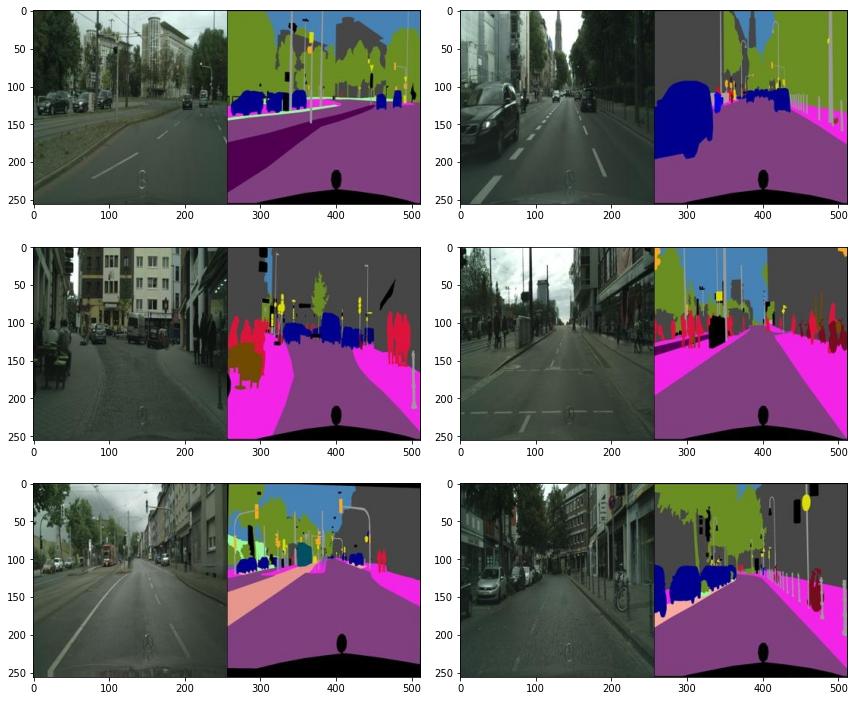

In [6]:
num_train = len(train_file_names)

plt.figure(figsize=(12,10))
for i in range(1, 7):
    f = f'{train_dir_path}/{train_file_names[np.random.randint(num_train)]}'
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.tight_layout()
plt.show()

- 데이터 크기 확인

In [7]:
f = train_dir_path + '/' + train_file_names[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


확인된 데이터는 (256, 512, 3) shape를 가진 컬러 이미지이다.<br>
이전 단계에서 이미지를 출력하였을 때, 이미지를 절반으로 나누에 앞부분을 discriminator에서 사용되는 실제 이미지로 뒷부분을 generator에서 사용되는 입력 이미지로 사용하면 되는 것처럼 보인다.

- 데이터 나누어 보기

데이터를 절반으로 나누는 것이 적당한 것인지 실제로 절반을 나누어 확인해 본다.

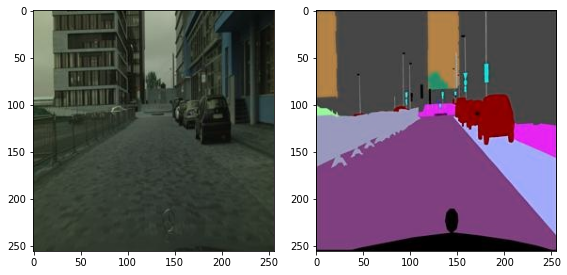

In [8]:
image_path = f'{train_dir_path}/{train_file_names[np.random.randint(num_train)]}'
img = cv2.imread(image_path, cv2.IMREAD_COLOR)
w = tf.shape(img)[1]//2
img_front = img[:, :w, :]
img_back  = img[:, w:, :]

plt.figure(figsize=(8,5))
plt.subplot(1,2,1); plt.imshow(img_front)
plt.subplot(1,2,2); plt.imshow(img_back)
plt.tight_layout()
plt.show()

## STEP 2. 데이터 전처리
---

### 1. normalize

In [9]:
def normalize(x):
    x = tf.cast(x, tf.float64)
    return (x/127.5) - 1

### 2. denormalize

In [10]:
def denormalize(x):
    x = (x+1) * 127.5
    x = x.numpy()
    return x.astype(np.uint8)

### 3. load image
입력받은 path에 존재하는 이미지를 읽어들여 normalize한 후, 절반을 나누어 두개의 이미지를 반환한다.

In [11]:
def load_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1]//2
    real = img[:, :w, :]
    real = tf.cast(real, tf.float32)
    
    seg = img[:, w:, :]
    seg = tf.cast(seg, tf.float32)
    
    return normalize(seg), normalize(real)

- load_image 테스트

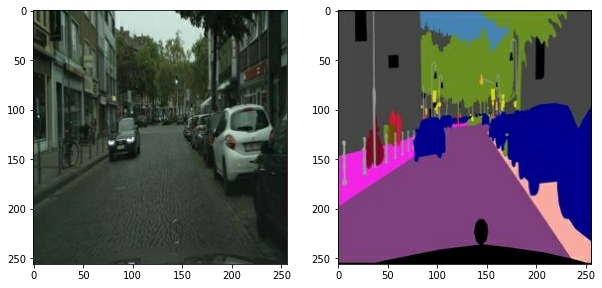

In [12]:
seg, real = load_image(f'{train_dir_path}/{train_file_names[0]}')

plt.figure(figsize=(10,8))
plt.subplot(1,2,1); plt.imshow(denormalize(real))
plt.subplot(1,2,2); plt.imshow(denormalize(seg))

### 4. Augmentation

In [13]:
@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(seg, real):
    """
    1. 두 이미지가 채널 축으로 연결됩니다. (tf.concat). 두 이미지가 각각 3채널인 경우 6채널이 됩니다.
    2. 1.의 결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼적용됩니다. (tf.pad)
    3. 2.의 결과에서 (256,256,6) 크기를 가진 이미지를 임의로 잘라냅니다. (tf.image.random_crop) 
    4. 3.의 결과를 50% 확률로 가로로 뒤집습니다. (tf.image.random_flip_left_right)
    5. 4.의 결과를 50% 확률로 세로로 뒤집습니다. (tf.image.random_flip_up_down) 
    6. 5.의 결과를 50% 확률로 회전시킵니다. (tf.image.rot90)
    """
    stacked = tf.concat([seg, real], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

- apply_augmentation 테스트

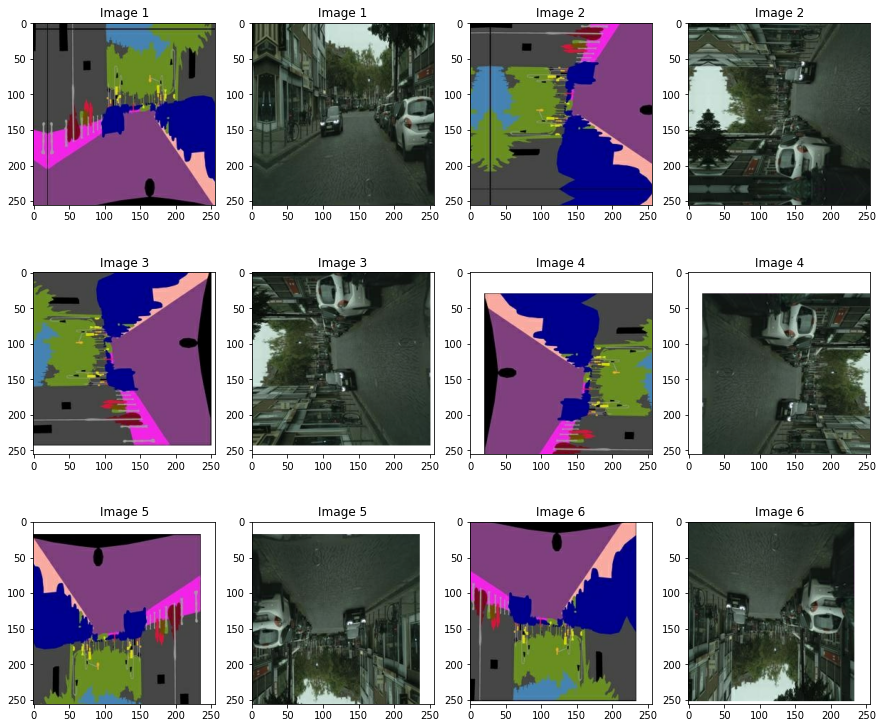

In [14]:
plt.figure(figsize=(15,13))
img_n = 1

for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(seg, real)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

### 5. train dataset 구성

In [15]:
def get_train(img_path):
    seg, real = load_image(img_path)
    seg, real = apply_augmentation(seg, real)
    return seg, real

In [16]:
batch_size = 20
train_images = data.Dataset.list_files(train_dir_path + "/*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(batch_size)

## STEP 3. 모델 구성
---

### 1. Generator

In [17]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [18]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [19]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

    def get_model_plot(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return tf.keras.utils.plot_model(Model(inputs, self.call(inputs)), show_shapes=True, dpi=64)

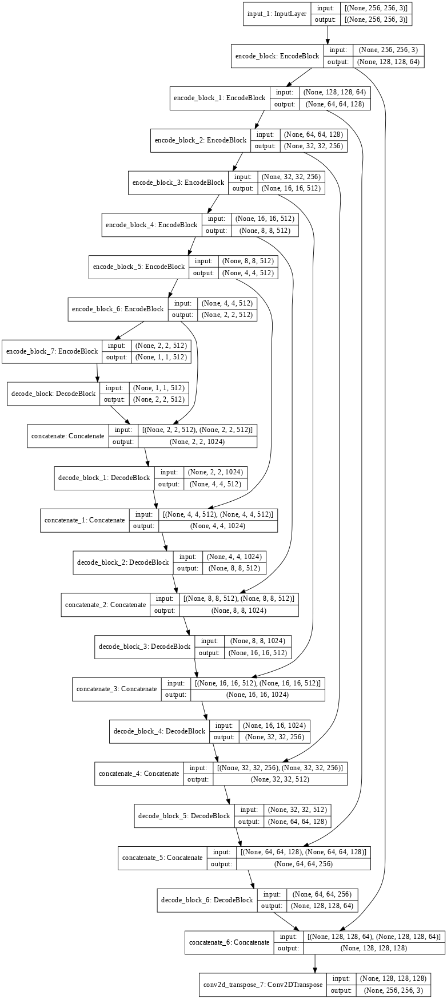

In [20]:
generator = UNetGenerator()
generator.get_model_plot()

In [21]:
generator.get_summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_2[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[1][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[1][0]             
____________________________________________________________________________________________

### 2. Discriminator

In [22]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

In [23]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

    def get_model_plot(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return tf.keras.utils.plot_model(Model((x, y), self.call(x, y)), show_shapes=True, dpi=64)

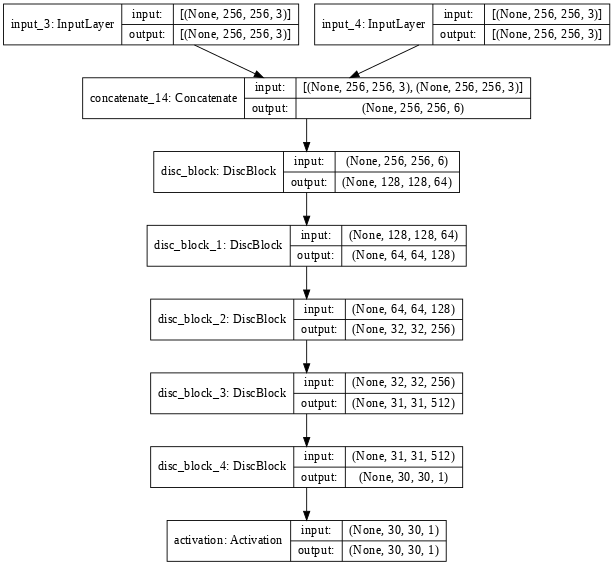

In [24]:
discriminator = Discriminator()
discriminator.get_model_plot()

In [25]:
discriminator.get_summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_14 (Concatenate)    (None, 256, 256, 6)  0           input_5[0][0]                    
                                                                 input_6[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_14[1][0]       

## STEP 4. 모델 학습 및 평가
---

### 1. 학습함수 정의

- loss

In [26]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

- optimizer

In [27]:
gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

- 모델 정의

In [28]:
generator = UNetGenerator()
discriminator = Discriminator()

- checkpoint

In [29]:
checkpoint_dir = workspace_path + '/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                 discriminator_optimizer=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

- 학습 함수

In [30]:
@tf.function
def train_step(seg, real):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake = generator(seg, training=True)
        # Discriminator 예측
        fake_disc = discriminator(seg, fake, training=True)
        real_disc = discriminator(seg, real, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake, real, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [31]:
def show_and_save_log_img(seg, fake, real, save_path, epoch, step):
    plt.figure(figsize=(12, 5))

    display_list = [seg, real, fake]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(denormalize(display_list[i]))
        plt.axis('off')

    plt.suptitle(f'EPOCH[{epoch}] - STEP[{step}]', fontsize=15)
    plt.tight_layout()
    plt.savefig(f'{save_path}/e_{epoch}_s_{step}.png')
    plt.show()

In [89]:
def fit(epochs):
    sample_img_seg, sample_img_real = load_image(train_dir_path + '/' + train_file_names[0])
    sample_img_seg = tf.reshape(sample_img_seg, [1, 256, 256, 3])

    history = {
        'generator_loss' : [],
        'l1_loss' : [],
        'discriminator_loss' : []
    }

    last_step = len(list(train_images)) - 1

    for epoch in range(1, epochs+1):
        for i, (seg, real) in enumerate(train_images):
            g_loss, l1_loss, d_loss = train_step(seg, real)
                    
            # 10회 반복마다 손실을 출력합니다.
            if (i+1) % 10 == 0:
                display.clear_output(wait=True)

                print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                        \nGenerator_loss:{g_loss.numpy():.4f} \
                        \nL1_loss:{l1_loss.numpy():.4f} \
                        \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")
                
                history['generator_loss'].append(g_loss.numpy())
                history['l1_loss'].append(l1_loss.numpy())
                history['discriminator_loss'].append(d_loss.numpy())
                
            if (i+1) % 50 == 0:
                prediction = generator(sample_img_seg, training=True)
                show_and_save_log_img(tf.reshape(sample_img_seg, [256, 256, 3]), 
                                      tf.reshape(prediction, [256, 256, 3]), 
                                      sample_img_real, f'{result_dir_path}/e{epochs}', epoch, i+1) 

        if (epoch + 1) % 64 == 0: # 10 epoch 마다 저장
            checkpoint.save(file_prefix = checkpoint_prefix)

    checkpoint.save(file_prefix = checkpoint_prefix)
    return history

- history 출력 함수

In [33]:
def show_history_plot(history):
    epochs = len(history['discriminator_loss'])
    
    plt.figure(figsize=(12, 5))
    plt.plot(history['discriminator_loss'])
    plt.plot(history['generator_loss'])
    plt.plot(history['l1_loss'])
    plt.title('Train Losses', fontsize=15)
    plt.ylabel('loss')
    plt.xticks(range(epochs), range(1, epochs+1))
    plt.xlabel('epoch')
    plt.legend(history.keys())
    plt.show()

- validation

In [62]:
def validation():
    fig, axes = plt.subplots(5, 3, figsize=(12, 20))
    axes = [ y for x in axes for y in x ]
    title = ['Input Image', 'Predicted Image', 'Ground Truth']

    for i, file_name in enumerate(val_file_names):
        path = val_dir_path + '/' + file_name
        seg, real = load_image(path)
        predict = tf.reshape(generator(tf.expand_dims(seg, 0)), [256, 256, 3])
        imgs = [seg, predict, real]

        for j in range(3):
            axes[i*3 + j].imshow(denormalize(imgs[j]))
            axes[i*3 + j].set_title(f'Val[{i+1}] - {title[j]}')
            axes[i*3 + j].axis('off')
    
    plt.tight_layout(pad=1.05)
    plt.show()

### 2. [TRY1] EPOCHS = 16

EPOCH[16] - STEP[50]                         
Generator_loss:0.7065                         
L1_loss:0.1799                         
Discriminator_loss:1.0661



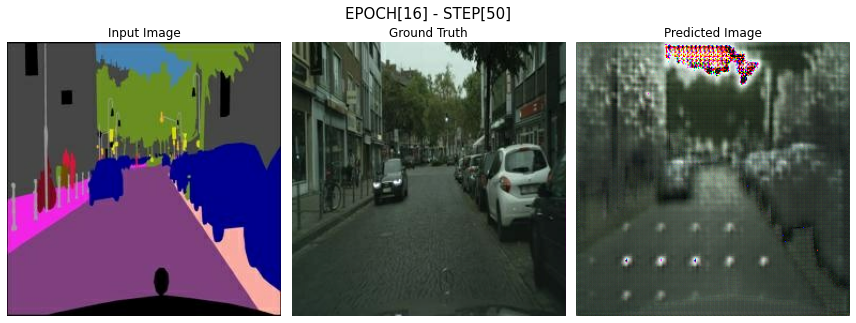

In [34]:
history_e_16 = fit(16)

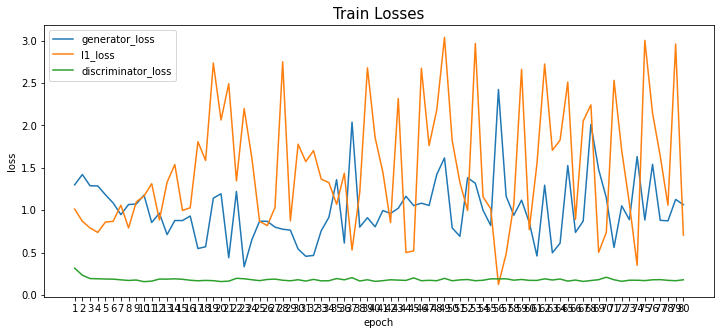

In [35]:
show_history_plot(history_e_16)

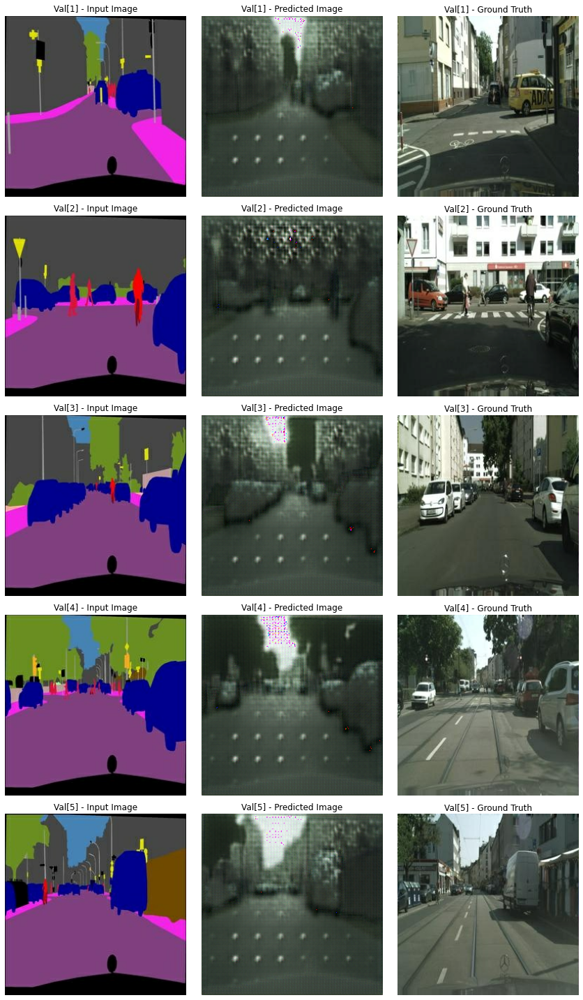

In [63]:
validation()

### 3. [TRY2] EPOCHS = 32
[TRY1]에서 학습시킨 모델을 추가적으로 16번 더 학습시켜 epochs가 총 32가 되도록 한다.<br>만약 커널 혹은 런타임을 재시작하였다면, checkpoint를 복구하여 학습을 진행한다.

EPOCH[16] - STEP[50]                         
Generator_loss:0.4776                         
L1_loss:0.1708                         
Discriminator_loss:1.4024



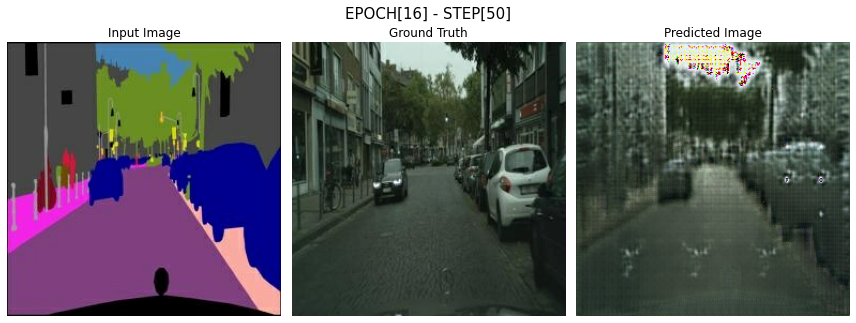

In [66]:
history_e_32 = fit(16)

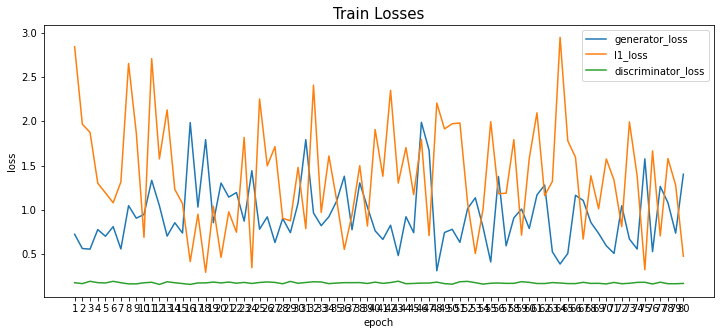

In [68]:
show_history_plot(history_e_32)

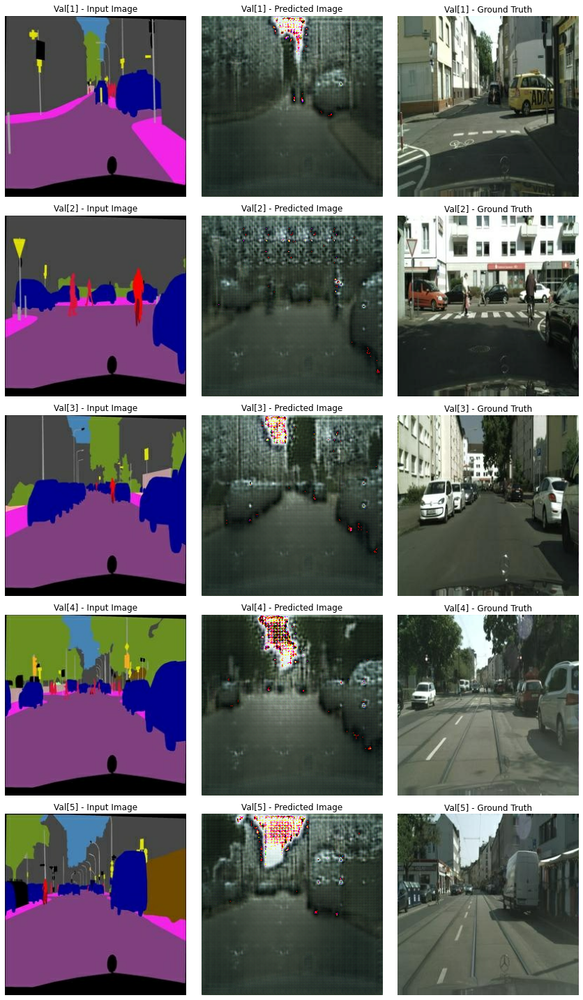

In [69]:
validation()

### 4. [TRY3] EPOCHS = 64
[TRY2]에서 학습시킨 모델을 추가적으로 32번 더 학습시켜 epochs가 총 64가 되도록 한다.<br>만약 커널 혹은 런타임을 재시작하였다면, checkpoint를 복구하여 학습을 진행한다.

EPOCH[32] - STEP[50]                         
Generator_loss:1.6200                         
L1_loss:0.1852                         
Discriminator_loss:0.4801



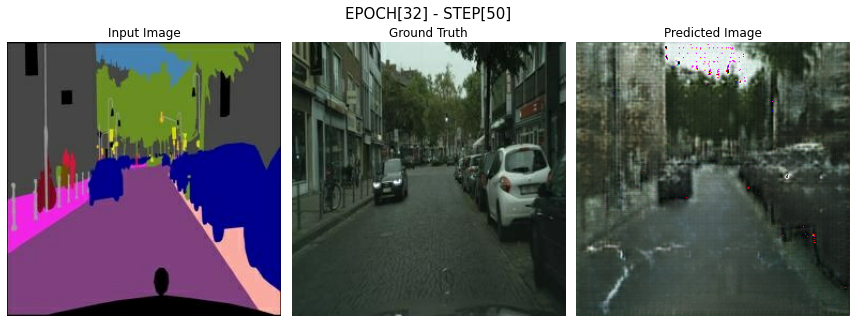

In [70]:
history_e_64 = fit(32)

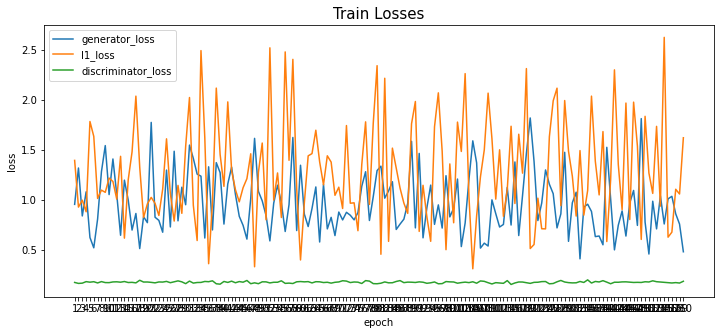

In [71]:
show_history_plot(history_e_64)

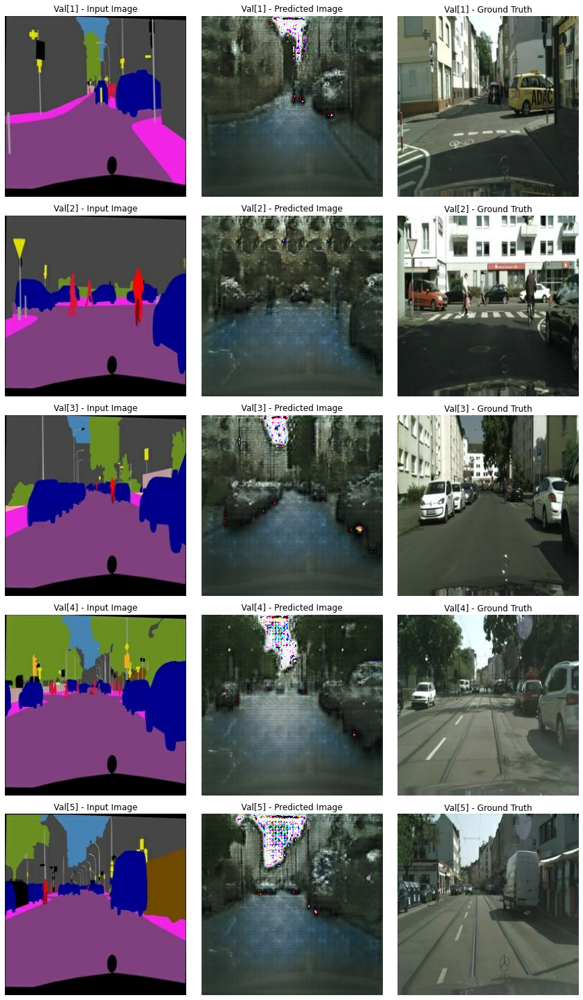

In [72]:
validation()

### 5. [TRY4] EPOCHS = 128
[TRY3]에서 학습시킨 모델을 추가적으로 64번 더 학습시켜 epochs가 총 128이 되도록 한다.<br>만약 커널 혹은 런타임을 재시작하였다면, checkpoint를 복구하여 학습을 진행한다.

EPOCH[64] - STEP[50]                         
Generator_loss:0.5355                         
L1_loss:0.1880                         
Discriminator_loss:1.1057



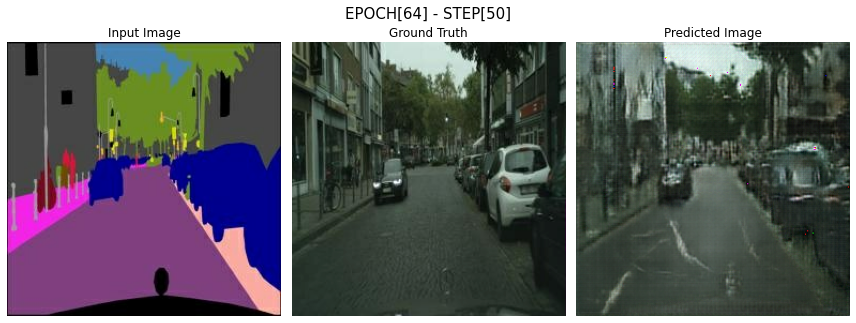

In [73]:
history_e_128 = fit(64)

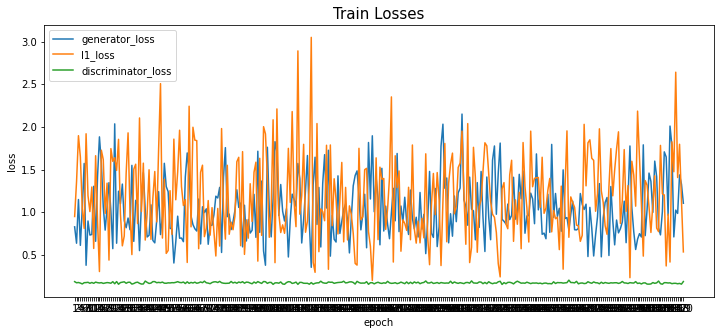

In [74]:
show_history_plot(history_e_128)

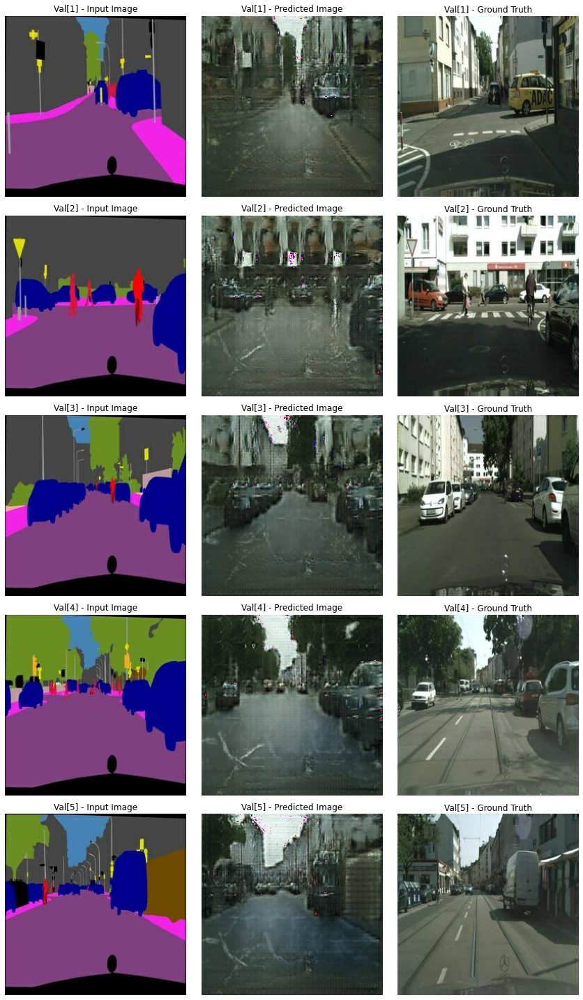

In [75]:
validation()

### 6. [TRY5] EPOCHS = 256
[TRY4]에서 학습시킨 모델을 추가적으로 128번 더 학습시켜 epochs가 총 256이 되도록 한다.<br>만약 커널 혹은 런타임을 재시작하였다면, checkpoint를 복구하여 학습을 진행한다.

EPOCH[128] - STEP[50]                         
Generator_loss:0.7540                         
L1_loss:0.1633                         
Discriminator_loss:1.0263



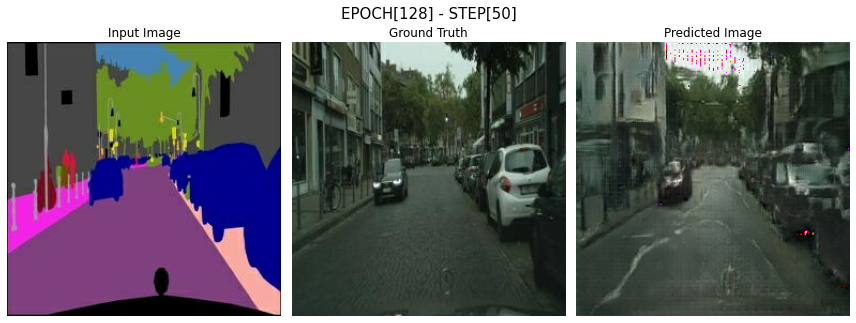

In [76]:
history_e_256 = fit(128)

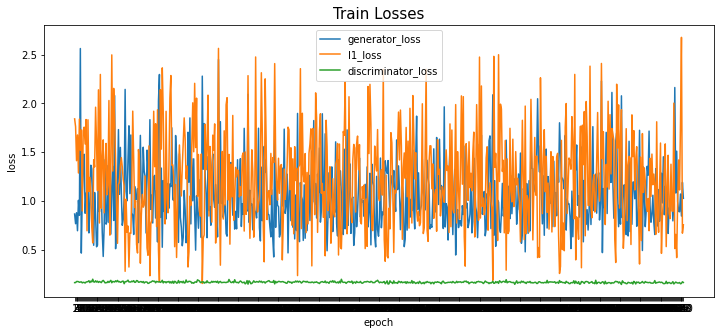

In [77]:
show_history_plot(history_e_256)

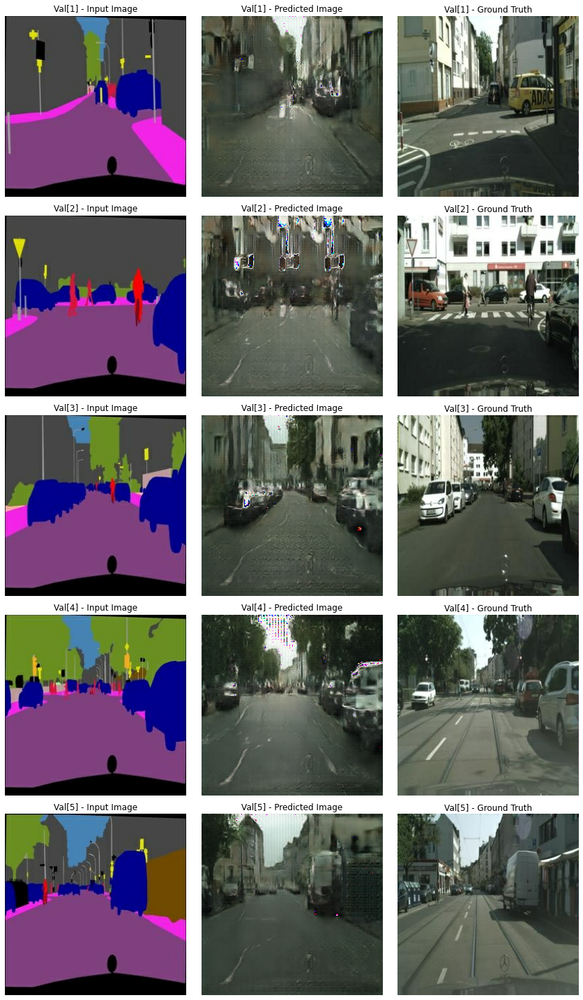

In [78]:
validation()

### 7. [TRY6] EPOCHS = 512
[TRY5]에서 학습시킨 모델을 추가적으로 256번 더 학습시켜 epochs가 총 512이 되도록 한다.<br>만약 커널 혹은 런타임을 재시작하였다면, checkpoint를 복구하여 학습을 진행한다.

EPOCH[256] - STEP[50]                         
Generator_loss:1.7789                         
L1_loss:0.1456                         
Discriminator_loss:0.4695



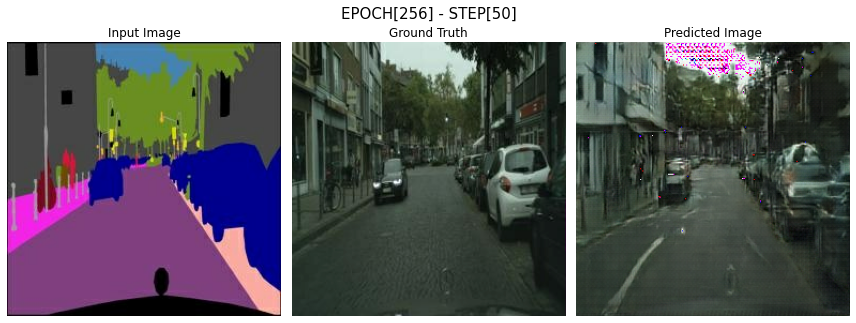

In [90]:
history_e_512 = fit(256)

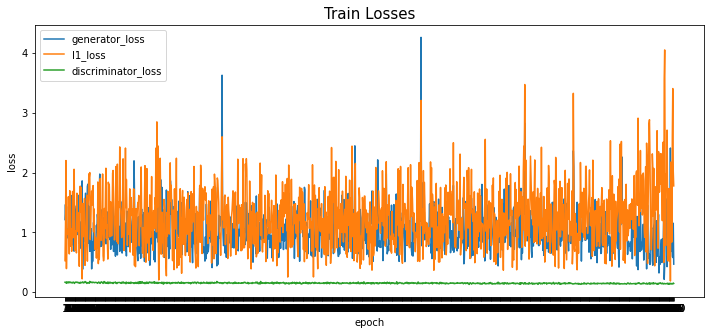

In [91]:
show_history_plot(history_e_512)

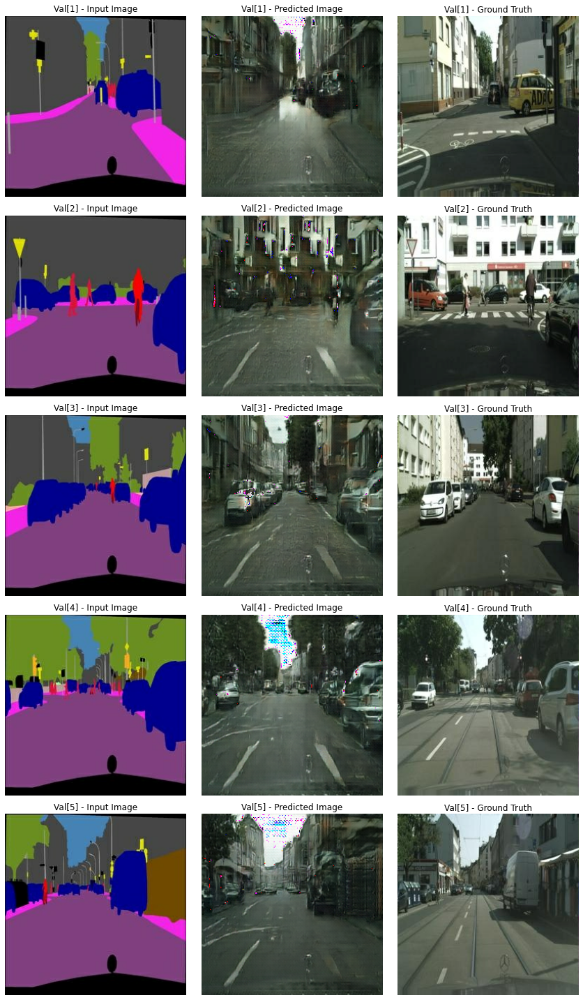

In [92]:
validation()

### 8. summary

#### 1. loss history plot 분석

그래프를 그리는 과정에서 오류가 있었다. legend의 순서가 discriminator_loss > generator_loss > l1_loss 순이 되어야 했는데, generator_loss > l1_loss > discriminator_loss 순으로 출력되었다.

l1_loss는 0.5이하의 값을 계속 유지하는 형세를 보였다. 반면, generator_loss와 discriminator_loss의 전개는 분산이 매우 큰 형태로 나타나, 학습이 제대로 수렴되고 있는지를 확인하기 어려웠다.

학습의 진행여부를 generator의 생성결과를 통하여 확인해야 겠다.

#### 2. sample data의 경과를 gif로 생성

- rename log files

In [12]:
! cd ./drive/MyDrive/aiffel/Exploration/E20_cGAN/result/e16 && for f in * ; do mv -- "$f" "016_$f" ; done
! cd ./drive/MyDrive/aiffel/Exploration/E20_cGAN/result/e32 && for f in * ; do mv -- "$f" "032_$f" ; done
! cd ./drive/MyDrive/aiffel/Exploration/E20_cGAN/result/e64 && for f in * ; do mv -- "$f" "064_$f" ; done
! cd ./drive/MyDrive/aiffel/Exploration/E20_cGAN/result/e128 && for f in * ; do mv -- "$f" "128_$f" ; done
! cd ./drive/MyDrive/aiffel/Exploration/E20_cGAN/result/e256 && for f in * ; do mv -- "$f" "256_$f" ; done
! cd ./drive/MyDrive/aiffel/Exploration/E20_cGAN/result/e512 && for f in * ; do mv -- "$f" "512_$f" ; done

- load all log files

In [16]:
log_file_names_16 = [ f'{result_dir_path}/e16/{name}' for name in os.listdir(result_dir_path + '/e16')]
log_file_names_32 = [ f'{result_dir_path}/e32/{name}' for name in os.listdir(result_dir_path + '/e32')]
log_file_names_64 = [ f'{result_dir_path}/e64/{name}' for name in os.listdir(result_dir_path + '/e64')]
log_file_names_128 = [ f'{result_dir_path}/e128/{name}' for name in os.listdir(result_dir_path + '/e128')]
log_file_names_256 = [ f'{result_dir_path}/e256/{name}' for name in os.listdir(result_dir_path + '/e256')]
log_file_names_512 = [ f'{result_dir_path}/e512/{name}' for name in os.listdir(result_dir_path + '/e512')]

In [18]:
log_file_paths = log_file_names_16 + log_file_names_32 + log_file_names_64 + log_file_names_128 + log_file_names_256 + log_file_names_512
log_file_paths[0], len(log_file_paths)

('./drive/MyDrive/aiffel/Exploration/E20_cGAN/result/e16/016_e_1_s_50.png',
 512)

In [ ]:
def load_log_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, 3)
    return img

log_imgs = [ load_log_img(path) for path in log_file_paths ]

In [25]:
log_imgs = [ img.numpy() for img in log_imgs ]

- create gif file

In [31]:
imageio.mimsave(result_dir_path + "/log.gif", log_imgs, fps=12)

![log](./result/log.gif)


생성된 gif를 확인한 결과, generator를 통해 생성된 이미지가 점점 더 실제 이미지와 비슷해져 감을 알 수 있었다.<br>
validation의 결과 역시 epochs를 증가실킬 때 마다 점점 이미지가 선명해져가는 것을 보아 학습이 올바른 방향으로 진행되어 가고 있다고 판단할 수 있었다.

## 결론
---

### 프로젝트 평가

1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다. <br>데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.
    - shift, crop, flip, rotation를 적용한 augmentation을 진행하여 데이터셋을 구축하였다.
2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다. <br>U-Net generator, discriminator 모델 구현이 완료되어 train_step이 안정적으로 진행됨을 확인하였다.
    - U-Net generator, discriminator로 구성된 pix2pix 모델을 구현하였고, 학습이 안정적으로 진행(step이 지날수록 real 데이터와 유사한 fake 데이터가 생성)됨을 결과를 통하여 확인할 수 있었다.
3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다. <br>10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.
    - 각 epochs 마다 validation set에 대한 결과를 출력하였다.
    - 매 50 step 마다 sample image에 대한 generation 결과를 저장하였고, 학습이 종료된 후 이를 gif로 생성하여 결과를 확인하였다.

### 회고

loss의 결과가 너무 산만하여, 제대로 학습이 되고 있는지 파악하기 어려웠다. gan의 학습 정도를 정량적으로 판별할 수 있는 방법에 대해서 더 알아봐야 겠다는 생각이 들었다.

총 epochs를 512번 수행하였는데, 결과가 그다지 만족스럽지 못하였다. 다음에 기회가 된다면 더 많이 학습을 시켜보아야 겠다.